<a href="https://colab.research.google.com/github/Fade141/Road_Segmentation/blob/main/Road_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Team Project for Road Segmentation
Hello Everyone, this is our Road Segmentation Project for CPS 4801 with Professor Huang. Abel did all the preprocessing of this notebook and together we made the Pytorch CustomDataset. We also worked together with the professors notes on making the DeepLab v3+ model. After this, Krish Performed the post processing of the deeplab v3+. For the U Net++, we both worked on the preprocessing and Krish setup the model and trained it and generated the result.

##Downloading the Data from Kaggle
link: https://www.kaggle.com/datasets/mehmetcubukcu/commaaicomplete/data



In [ ]:
pip install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 95.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninsta

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mehmetcubukcu/commaaicomplete")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/commaaicomplete


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, random_split, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision.io import decode_image
from torchvision.transforms.v2 import Compose, Resize, RandomEqualize, ToDtype
from torchvision import transforms
from pathlib import Path
from os import listdir
from tqdm import tqdm
import segmentation_models_pytorch as seg_models

##Attempt 1

In [ ]:
path = Path('/kaggle/input/commaaicomplete/comma10k') # My path for the dataset
image_height, image_width, n_channels = 256, 256, 3
# This is my preset size for all images and masks, being (256, 256, 3)
colors = torch.from_numpy(np.float32([
    to_rgb('#402020'),
    to_rgb('#ff0000'),
    to_rgb('#808060'),
    to_rgb('#00ff66'),
    to_rgb('#cc00ff')
]) * 255.).type(torch.long)
# All this information i used from the datacard in the dataset
n_classes = colors.shape[0]
# I then set the number of classes corresponding to the number of the colors shape

In [ ]:
data = []

for filename in listdir(path / 'imgs'):
    path_to_image = path / 'imgs' / filename
    path_to_mask = path / 'masks' / filename

    data.append((path_to_image, path_to_mask))

df = pd.DataFrame(data, columns=['path_to_image', 'path_to_mask'])
df = df[:500]

df
# I then use a Pandas DataFrame where i placed my images and masks in order
# I sliced the dataframe to get the first 500 as 9888 imgs is too much


,path_to_image,path_to_mask
0,/kaggle/input/commaaicomplete/comma10k/imgs/37...,/kaggle/input/commaaicomplete/comma10k/masks/3...
1,/kaggle/input/commaaicomplete/comma10k/imgs/76...,/kaggle/input/commaaicomplete/comma10k/masks/7...
2,/kaggle/input/commaaicomplete/comma10k/imgs/56...,/kaggle/input/commaaicomplete/comma10k/masks/5...
3,/kaggle/input/commaaicomplete/comma10k/imgs/65...,/kaggle/input/commaaicomplete/comma10k/masks/6...
4,/kaggle/input/commaaicomplete/comma10k/imgs/04...,/kaggle/input/commaaicomplete/comma10k/masks/0...
...,...,...
495,/kaggle/input/commaaicomplete/comma10k/imgs/87...,/kaggle/input/commaaicomplete/comma10k/masks/8...
496,/kaggle/input/commaaicomplete/comma10k/imgs/72...,/kaggle/input/commaaicomplete/comma10k/masks/7...
497,/kaggle/input/commaaicomplete/comma10k/imgs/55...,/kaggle/input/commaaicomplete/comma10k/masks/5...
498,/kaggle/input/commaaicomplete/comma10k/imgs/59...,/kaggle/input/commaaicomplete/comma10k/masks/5...


In [ ]:
image_transform = Compose([
    Resize(size=(image_height, image_width)),
    #RandomEqualize(p=1),
    ToDtype(dtype=torch.float, scale=True)
])
mask_transform = Compose([
    Resize(size=(image_height, image_width), interpolation=InterpolationMode.NEAREST),
    ToDtype(dtype=torch.long)
])
#Resize both to 256, 256, 3
#converted imgs to torch.float and masks to torch.long

In [ ]:
class SegmentationData(Dataset):
    def __init__(self, df, colors, image_transform, mask_transform):
        self.df = df
        self.colors = colors
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __getitem__(self, idx):
        path_to_image, path_to_mask = self.df.iloc[idx]

        image = decode_image(path_to_image, mode='rgb')
        colored_mask = decode_image(path_to_mask, mode='rgb')
        #image = image.unsqueeze(0)
        transformed_image = self.image_transform(image)
        transformed_colored_mask = self.mask_transform(colored_mask)

        transformed_mask = transformed_colored_mask.permute(1, 2, 0).unsqueeze(dim=2)
        transformed_mask = (transformed_mask == self.colors).sum(dim=3).argmax(dim=2)

        return transformed_image, transformed_mask

    def __len__(self):
        return self.df.shape[0]

In [ ]:
#Experimentation result with GPT

def show_images(images, titles):
    fig, ax = plt.subplots(nrows=1, ncols=len(images), figsize=(6 * len(images), 6))
    plt.subplots_adjust(wspace=0)
    for i, (image, title) in enumerate(zip(images, titles)):
        if image.shape[0] == 1:
            ax[i].imshow(image.permute(1, 2, 0), interpolation='nearest', cmap='magma_r')
        else:
            ax[i].imshow(image.permute(1, 2, 0))
        ax[i].set_title(title)
        ax[i].axis(False)
    plt.show()

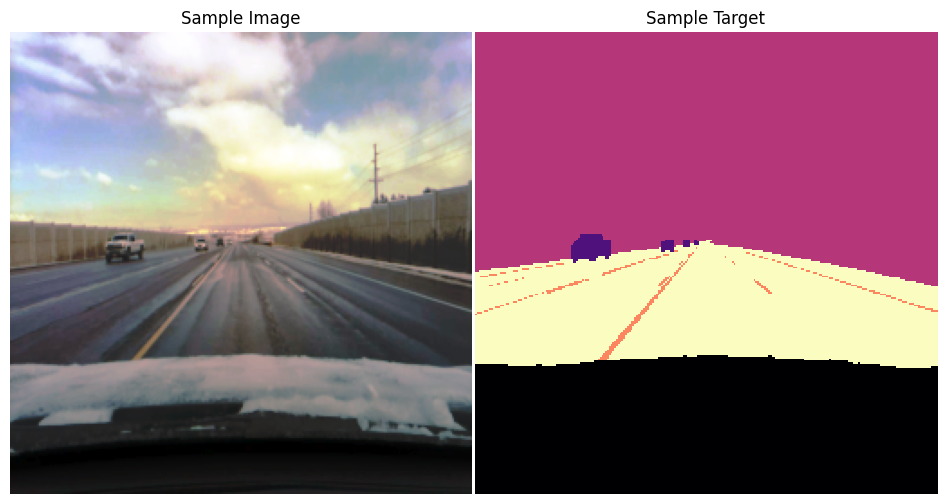

In [ ]:
ds = SegmentationData(df, colors, image_transform, mask_transform)

image, mask = ds[2]

show_images((image, mask.unsqueeze(dim=0)), ('Sample Image', 'Sample Target'))

In [ ]:
from torchvision import models, transforms
import torch.nn as nn
batch_size = 32

train_ds, val_ds, test_ds = random_split(ds, (0.85, 0.05, 0.1),
                                         torch.Generator().manual_seed(0))

train_dl = DataLoader(train_ds, batch_size, shuffle=True)
val_dl = DataLoader(val_ds, batch_size)
test_dl = DataLoader(test_ds, batch_size)
# I split my data into 3 parts:
# Train : 85 percent
# Validation : 5 percent
# Test : 10 percent

In [ ]:
print(colors.shape)

torch.Size([5, 3])


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
model = models.segmentation.deeplabv3_resnet50(pretrained=True)
# Use the DeepLab V3+ model pretrained CICO
model.classifier[4] = nn.Conv2d(256, 5, kernel_size=(1, 1))
# Since i dont have 21 classes like the CICO dataset pretrained, I altered the last method with 5 classes
model = model.to(device) # added to GPU
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = torch.nn.CrossEntropyLoss()
# Best to use this as it handles unspecified indexes.

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for images, masks in train_dl:
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)['out']
        outputs = F.interpolate(outputs, size=masks.shape[1:], mode='bilinear', align_corners=False)
        outputs = outputs.float()
        masks = masks.long()
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss:.4f}")
# 20 epochs total using the training dataloader
# I feed the model with the images and set it as result
# i resized the output to match the mask size so the images size remains the same, could lead to issues if not
# set it to float type
# Should be set as long type for masks, but ensured as I recieved GPU Errors
# calculating the loss using criterion(the output of the image versus the mask), then used backward function to
# compute the loss and added to total_loss

Epoch 1/10, Loss: 14.3120
Epoch 2/10, Loss: 6.7958
Epoch 3/10, Loss: 4.7994
Epoch 4/10, Loss: 3.9400
Epoch 5/10, Loss: 3.4352
Epoch 6/10, Loss: 3.0926
Epoch 7/10, Loss: 2.8005
Epoch 8/10, Loss: 2.5932
Epoch 9/10, Loss: 2.3850
Epoch 10/10, Loss: 2.2242


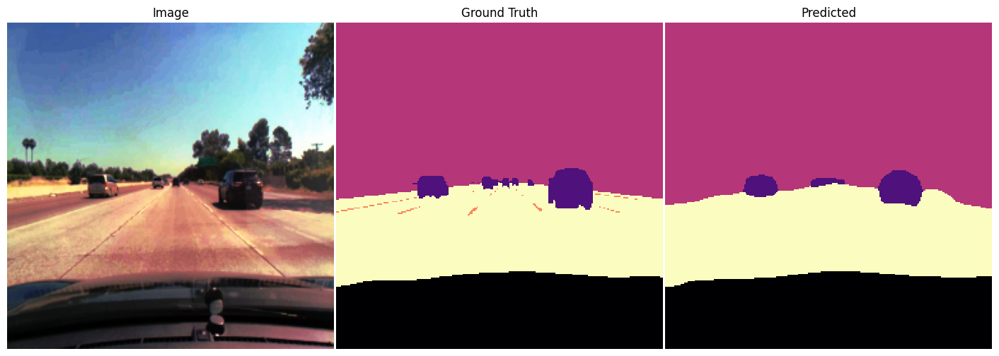

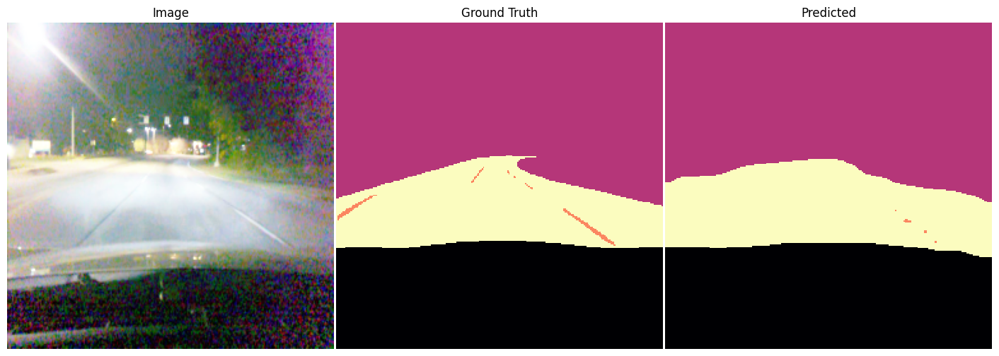

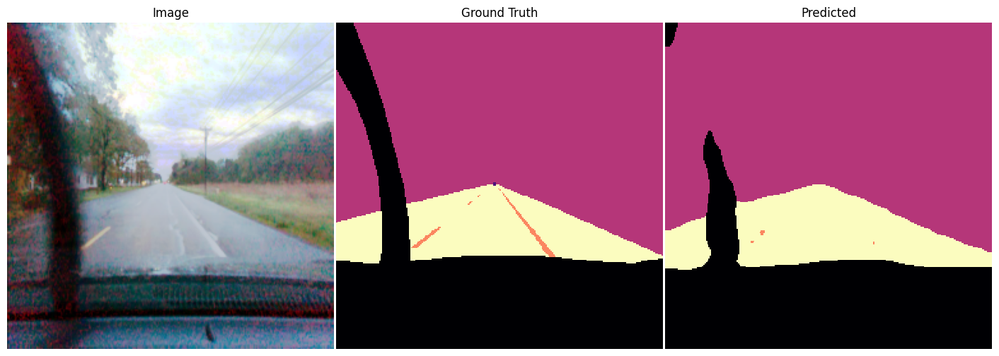

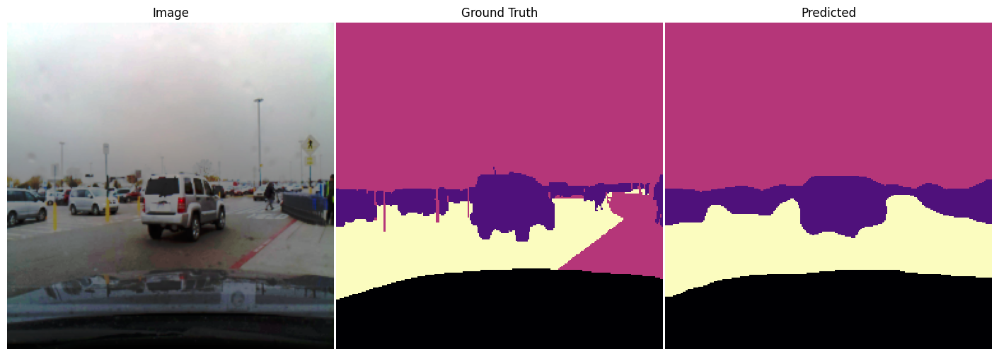

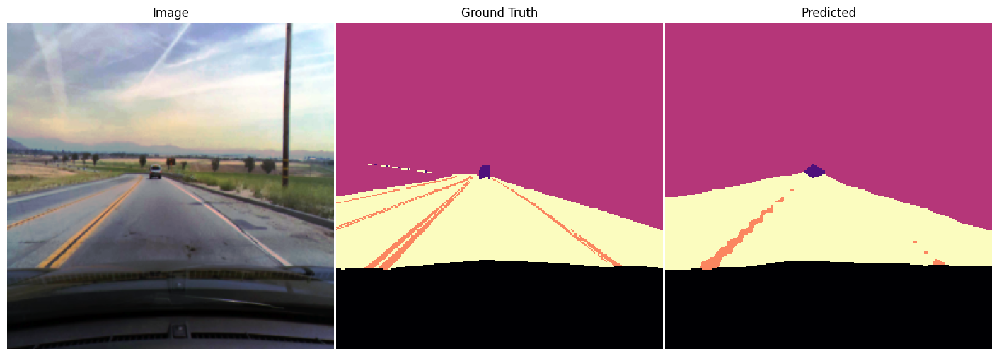

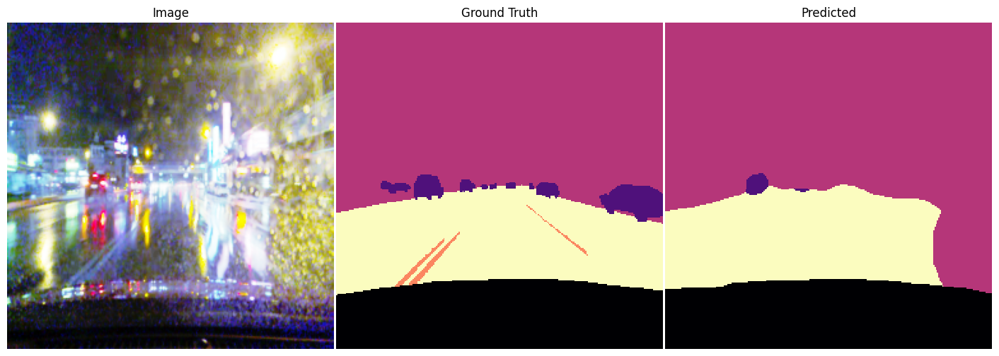

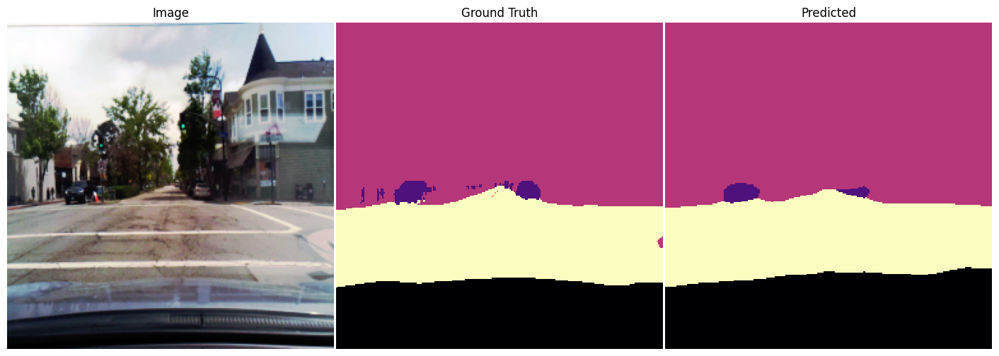

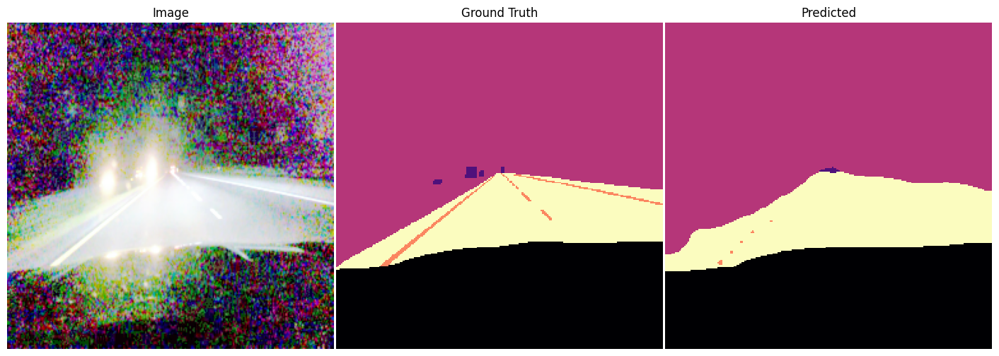

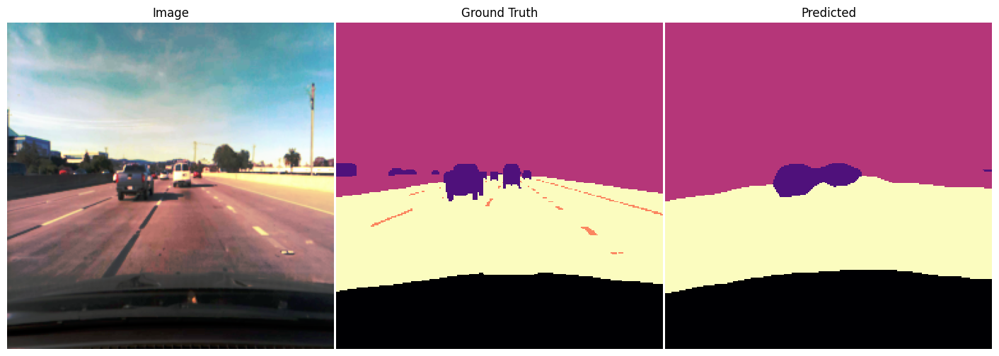

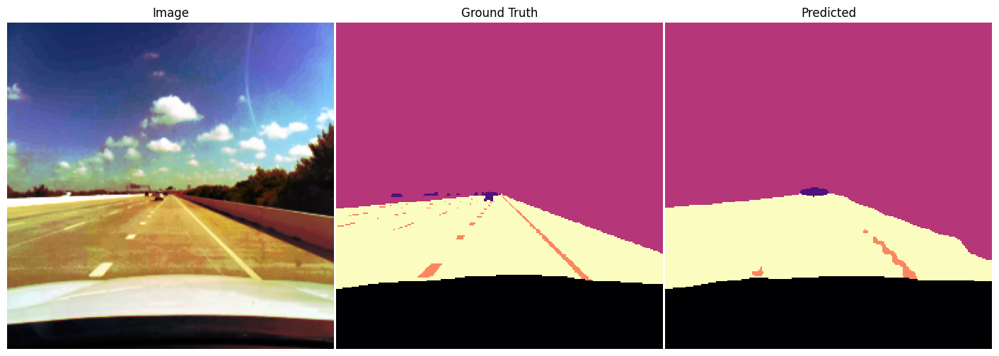

In [ ]:
model.eval()
with torch.no_grad():
    for i in range(10):
        image, mask = test_ds[i]

        if image.ndim == 2:
            image = image.unsqueeze(0)

        input_tensor = image.unsqueeze(0).to(device)
        logits = model(input_tensor)
        if isinstance(logits, dict) and 'out' in logits:
            logits = logits['out']

        probs = F.softmax(logits, dim=1)
        preds = torch.argmax(probs, dim=1)

        show_images((image, mask.unsqueeze(0), preds.cpu()),
                    ('Image', 'Ground Truth', 'Predicted'))

# Post processing fully connected CRF - helpful for boundary sharpness

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score
import numpy as np

# Step 1: Collect all predictions and labels
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, labels in tqdm(test_dl, desc="Evaluating Metrics"):
        images = images.to("cuda")
        labels = labels.to("cuda")

        outputs = model(images)['out']
        preds = torch.argmax(outputs, dim=1)

        all_preds.append(preds.cpu().numpy().flatten())
        all_labels.append(labels.cpu().numpy().flatten())

# Step 2: Flatten arrays
all_preds = np.concatenate(all_preds)
all_labels = np.concatenate(all_labels)

# Step 3: Confusion Matrix
conf_matrix = confusion_matrix(all_labels, all_preds)
print("\nConfusion Matrix:")
print(conf_matrix)

# Step 4: Precision and Recall (macro for all classes)
precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

print(f"\nPrecision (macro avg): {precision:.4f}")
print(f"Recall (macro avg): {recall:.4f}")


Evaluating Metrics: 100%|██████████| 4/4 [00:02<00:00,  1.67it/s]



Confusion Matrix:
[[ 565594    1343   15468    3746    8583]
 [  13713    3372     158      69     235]
 [  45176      71 1673612    8863    1990]
 [   6657       0   13381   87174      10]
 [  10941     111    6845      62  809626]]

Precision (macro avg): 0.8816
Recall (macro avg): 0.7804


In [ ]:
import torch
import numpy as np
from tqdm import tqdm
from torchvision.io import decode_image

# Set up classes
n_classes = 5  # Number of classes
class_names = ['Background', 'Road', 'Grass', 'Lane', 'Car']

# Create a list to store frequency of each class
class_pixel_counts = np.zeros(n_classes)

# Go through the dataset and calculate frequency of each class
for path_to_image, path_to_mask in tqdm(df[['path_to_image', 'path_to_mask']].values):
    # Load the mask image (this will be a grayscale image where each pixel is an index for the class)
    mask = decode_image(path_to_mask, mode='rgb')  # Assuming mask is RGB with class colors

    # Convert the mask to a tensor and reshape to (height * width, n_channels)
    mask = mask.permute(1, 2, 0).view(-1, 3)  # Flatten image to a 2D tensor

    # Identify class by color (assuming each class has a distinct color in RGB)
    for i, color in enumerate(colors):
        # Match pixels of that class (e.g., color of road or lane)
        mask_class = torch.all(mask == color, dim=1).sum().item()
        class_pixel_counts[i] += mask_class

# Now compute the weights based on the inverse of the frequency of each class
total_pixels = class_pixel_counts.sum()
class_weights = total_pixels / (n_classes * class_pixel_counts)

# Print the class weights
for class_name, weight in zip(class_names, class_weights):
    print(f"Class: {class_name}, Weight: {weight:.4f}")

# You can now use these weights in your loss function
weights = torch.tensor(class_weights, device=device)

100%|██████████| 500/500 [00:12<00:00, 39.87it/s]

Class: Background, Weight: 1.0678
Class: Road, Weight: 34.1248
Class: Grass, Weight: 0.3810
Class: Lane, Weight: 6.6626
Class: Car, Weight: 0.7941


In [ ]:
# The class weights calculated earlier (these can be adjusted if needed)
class_weights = torch.tensor([1.0678, 34.1248, 0.3810, 6.6626, 0.7941]).float().to(device)

# Modify the criterion to include class weights
criterion = nn.CrossEntropyLoss(weight=class_weights)

# During training loop:
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for images, masks in train_dl:
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)['out']
        outputs = F.interpolate(outputs, size=masks.shape[1:], mode='bilinear', align_corners=False)

        # Ensure the data types are correct
        outputs = outputs.float()
        masks = masks.long()

        # Compute the loss with class weights
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss:.4f}")

Epoch 1/20, Loss: 2.5531
Epoch 2/20, Loss: 2.5284
Epoch 3/20, Loss: 2.5291
Epoch 4/20, Loss: 2.5225
Epoch 5/20, Loss: 2.5017
Epoch 6/20, Loss: 2.5202
Epoch 7/20, Loss: 2.5002
Epoch 8/20, Loss: 2.4921
Epoch 9/20, Loss: 2.4914
Epoch 10/20, Loss: 2.4795
Epoch 11/20, Loss: 2.4739
Epoch 12/20, Loss: 2.4540
Epoch 13/20, Loss: 2.4434
Epoch 14/20, Loss: 2.4417
Epoch 15/20, Loss: 2.4288
Epoch 16/20, Loss: 2.4269
Epoch 17/20, Loss: 2.4155
Epoch 18/20, Loss: 2.4046
Epoch 19/20, Loss: 2.4060
Epoch 20/20, Loss: 2.4203


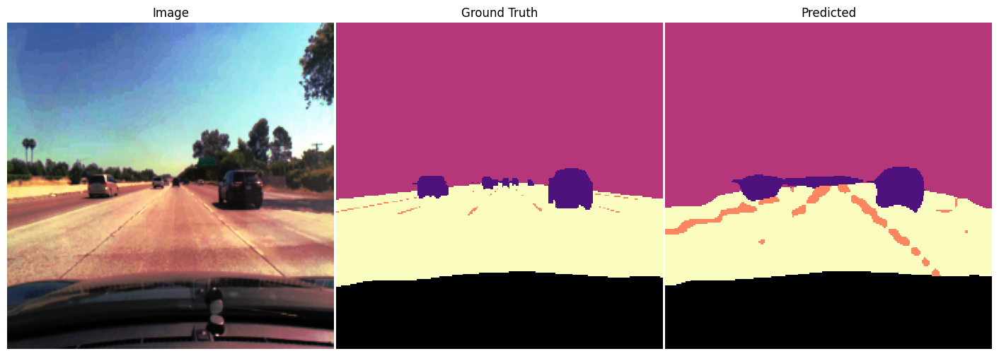

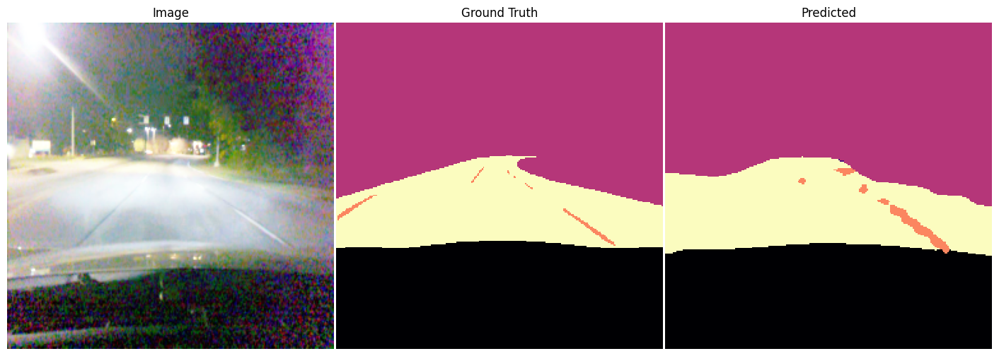

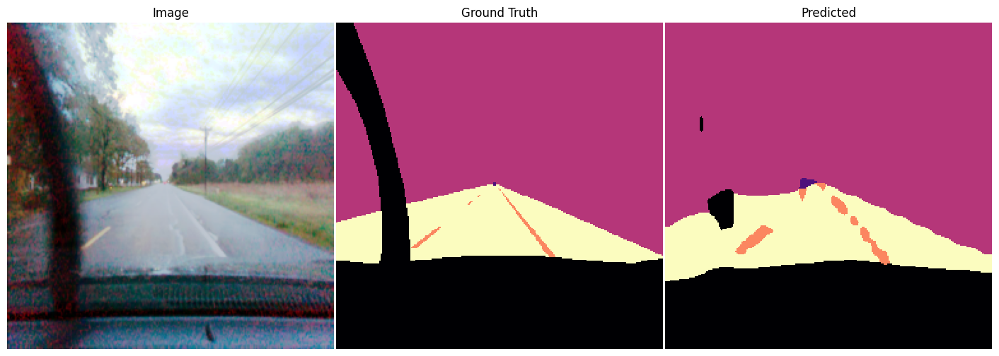

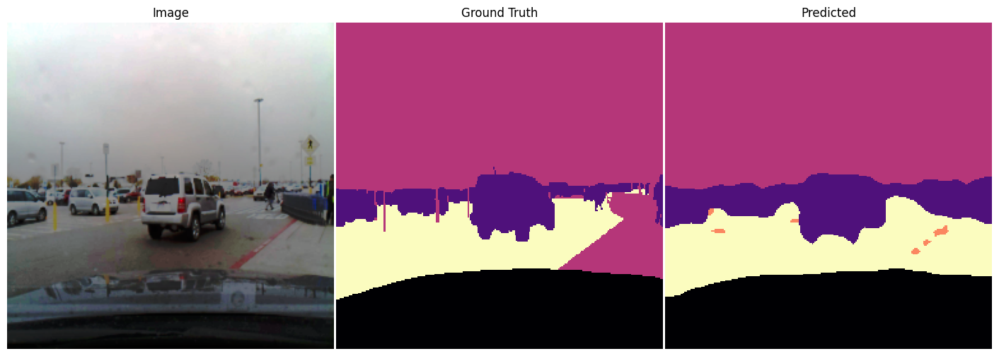

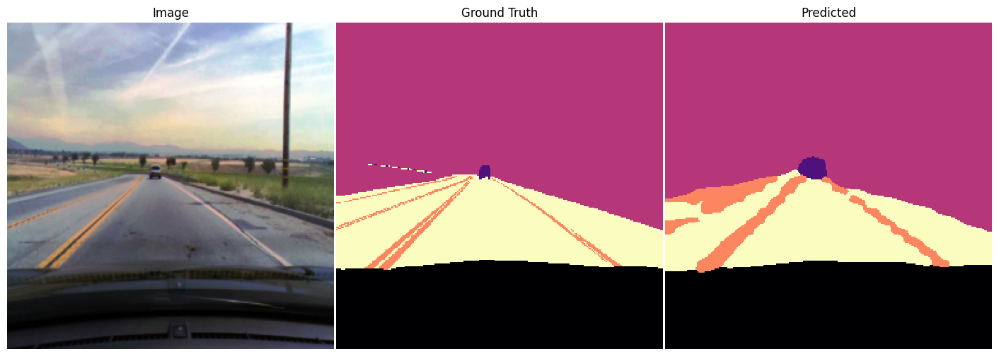

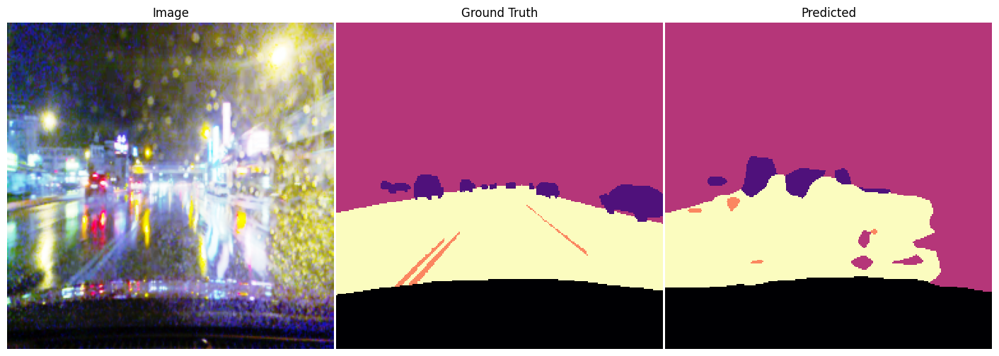

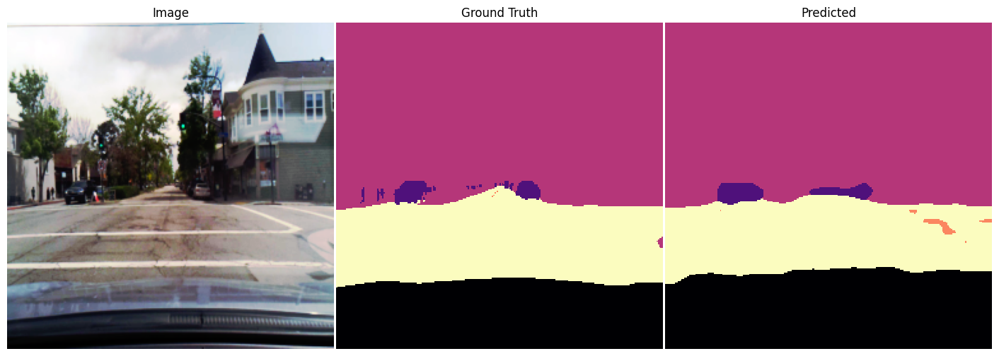

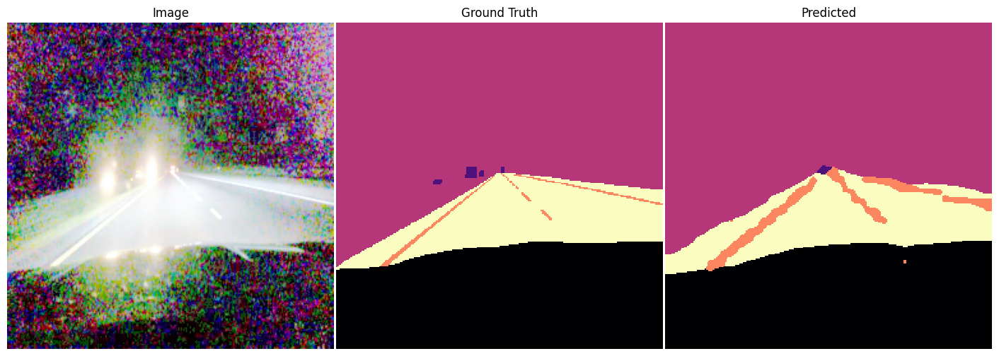

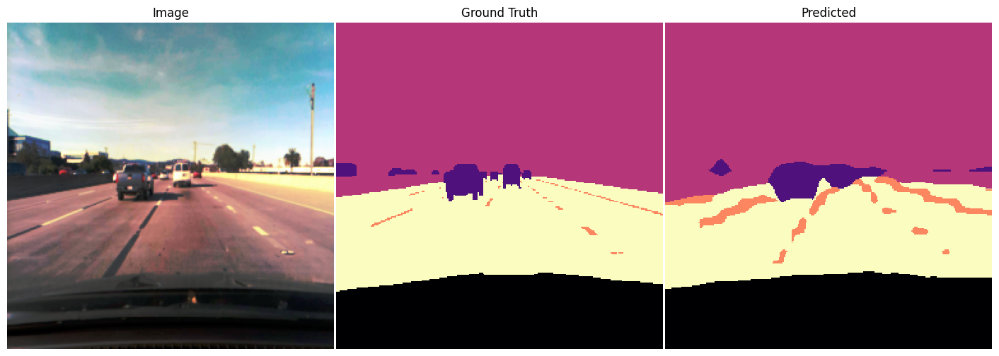

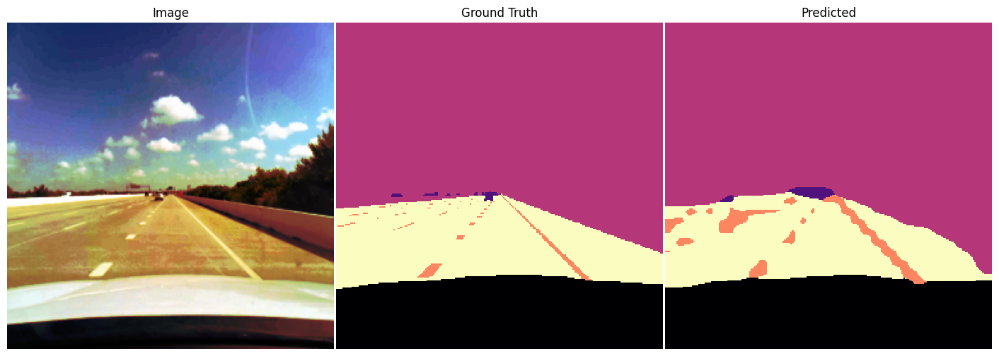

In [ ]:
model.eval()
with torch.no_grad():
    for i in range(10):
        image, mask = test_ds[i]

        if image.ndim == 2:
            image = image.unsqueeze(0)

        input_tensor = image.unsqueeze(0).to(device)
        logits = model(input_tensor)
        if isinstance(logits, dict) and 'out' in logits:
            logits = logits['out']

        probs = F.softmax(logits, dim=1)
        preds = torch.argmax(probs, dim=1)

        show_images((image, mask.unsqueeze(0), preds.cpu()),
                    ('Image', 'Ground Truth', 'Predicted'))

##Attempt 2:

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, random_split, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision.io import decode_image
from torchvision.transforms.v2 import Compose, Resize, RandomEqualize, ToDtype, InterpolationMode
from pathlib import Path
from os import listdir
from tqdm import tqdm
import segmentation_models_pytorch as seg_models
import os
from PIL import Image
from torch import nn
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader
import random
from sklearn.model_selection import train_test_split
import glob
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import cv2
from torchvision.utils import save_image

In [ ]:
def show_images(images, titles):
    fig, ax = plt.subplots(nrows=1, ncols=len(images), figsize=(6 * len(images), 6))
    plt.subplots_adjust(wspace=0)
    for i, (image, title) in enumerate(zip(images, titles)):
        if image.shape[0] == 1:
            ax[i].imshow(image.permute(1, 2, 0), interpolation='nearest', cmap='magma_r')
        else:
            ax[i].imshow(image.permute(1, 2, 0))
        ax[i].set_title(title)
        ax[i].axis(False)
    plt.show()
    # Same code...

In [ ]:
image_height, image_width, n_channels = 256, 256, 3

colors = torch.from_numpy(np.float32([
    to_rgb('#402020'),
    to_rgb('#ff0000'),
    to_rgb('#808060'),
    to_rgb('#00ff66'),
    to_rgb('#cc00ff')
]) * 255.).type(torch.long)

n_classes = colors.shape[0]

Number of images: 500
Number of masks: 500


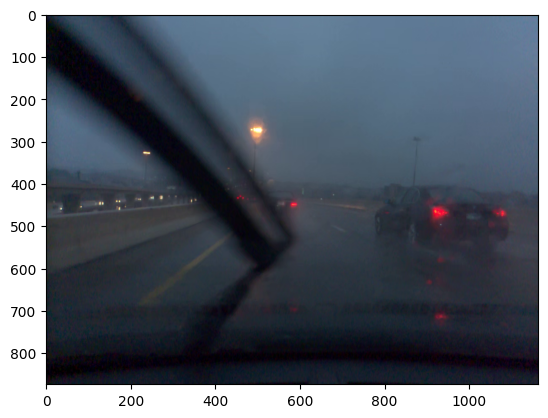

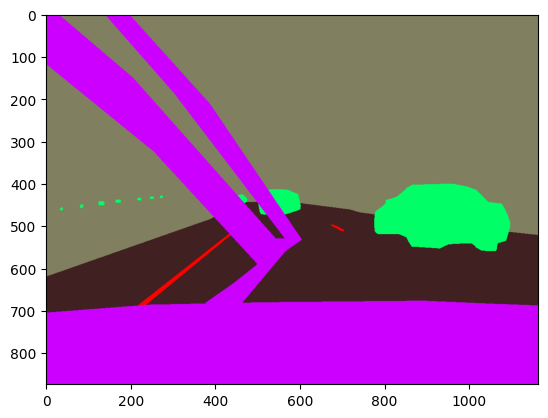

[  0  32  64  96 102 128 204 255]


In [ ]:
image_path = '/kaggle/input/commaaicomplete/comma10k/imgs'
mask_path = '/kaggle/input/commaaicomplete/comma10k/masks'

def load_images_and_labels(base_path):
    images = []
    for filename in os.listdir(base_path):
        filepath = os.path.join(base_path, filename)
        if filepath.endswith(".png"):
            images.append(filepath)

    return images

image_path = load_images_and_labels(image_path)
mask_path = load_images_and_labels(mask_path)

image_path = image_path[:500]
mask_path = mask_path[:500]

print("Number of images:", len(image_path))
print("Number of masks:", len(mask_path))

plt.imshow(Image.open(image_path[0]))
plt.show()
plt.imshow(Image.open(mask_path[0]))
plt.show()

mask_array = np.array(Image.open(mask_path[0]))
print(np.unique(mask_array))

# In this code, it will only retreive the img and mask if ends in .PNG

In [ ]:
from sklearn.model_selection import train_test_split

X = image_path
y = mask_path

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# 80 / 20 split even

In [ ]:
image_transform = Compose([
    Resize(size=(image_height, image_width)),
    #RandomEqualize(p=1),
    ToDtype(dtype=torch.float, scale=True)
])
#Image is torch.float whereas mask is torch.long for model type

mask_transform = Compose([
    Resize(size=(image_height, image_width), interpolation=InterpolationMode.NEAREST),
    ToDtype(dtype=torch.long)
])

In [ ]:
from torchvision import transforms

image_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),  # Converts to float tensor and normalizes to [0, 1]
])

label_transform = transforms.Compose([
    transforms.Resize((224, 224), interpolation=transforms.InterpolationMode.NEAREST),
    transforms.PILToTensor(),  # Keeps label as integers
])

In [ ]:
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms as transforms
import torch

class CustomDataset(Dataset):
    def __init__(self, images, labels, image_transform=None, label_transform=None):
        self.images = images
        self.labels = labels
        self.image_transform = image_transform
        self.label_transform = label_transform

        # Mapping from pixel values to class indices
        self.class_map = {
            42: 0,
            76: 1,
            90: 2,
            124: 3,
            161: 4
        }

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        label_path = self.labels[idx]
        image = Image.open(image_path).convert("RGB")
        label = Image.open(label_path).convert("L")

        if self.image_transform:
            image = self.image_transform(image)

        if self.label_transform:
            label = self.label_transform(label)

        # Map pixel values to class indices
        label = torch.squeeze(label)  # [1, H, W] -> [H, W]
        label_remapped = torch.zeros_like(label, dtype=torch.long)
        for pixel_val, class_idx in self.class_map.items():
            label_remapped[label == pixel_val] = class_idx

        return image, label_remapped



train_dataset = CustomDataset(X_train, y_train, image_transform=image_transform, label_transform=label_transform)
test_dataset = CustomDataset(X_test, y_test, image_transform=image_transform, label_transform=label_transform)

image, label = train_dataset[0]
print(image.shape)  # Should be [3, 224, 224]
print(label.shape)  # Should be [224, 224]
print(torch.unique(label))  # Should show tensor([0, 1, 2, 3, 4])


torch.Size([3, 224, 224])
torch.Size([224, 224])
tensor([0, 1, 2, 3, 4])


In [ ]:
# DataLoader
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2)
# Setting Batch Size 16, perfect for size

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = seg_models.UnetPlusPlus(classes=5)
model = model.to(device)

# Pretrained model

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [ ]:
# Training loop
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss:.4f}")

# Save model
torch.save(model.state_dict(), "deeplabv3_model.pth")

# Inference and visualization
def decode_segmap(label_mask, colormap):
    h, w = label_mask.shape
    rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for label, color in colormap.items():
        rgb[label_mask == label] = color
    return rgb

# Not needed decode_segmap as I display next cell


Epoch 1/20, Loss: 1.2068
Epoch 2/20, Loss: 1.1626
Epoch 3/20, Loss: 1.1271
Epoch 4/20, Loss: 1.1159
Epoch 5/20, Loss: 1.0838
Epoch 6/20, Loss: 1.0401
Epoch 7/20, Loss: 1.0133
Epoch 8/20, Loss: 0.9820
Epoch 9/20, Loss: 0.9655
Epoch 10/20, Loss: 0.9233
Epoch 11/20, Loss: 0.9021
Epoch 12/20, Loss: 0.8773
Epoch 13/20, Loss: 0.8674
Epoch 14/20, Loss: 0.8405
Epoch 15/20, Loss: 0.8338
Epoch 16/20, Loss: 0.8235
Epoch 17/20, Loss: 0.7938
Epoch 18/20, Loss: 0.7670
Epoch 19/20, Loss: 0.7531
Epoch 20/20, Loss: 0.7383


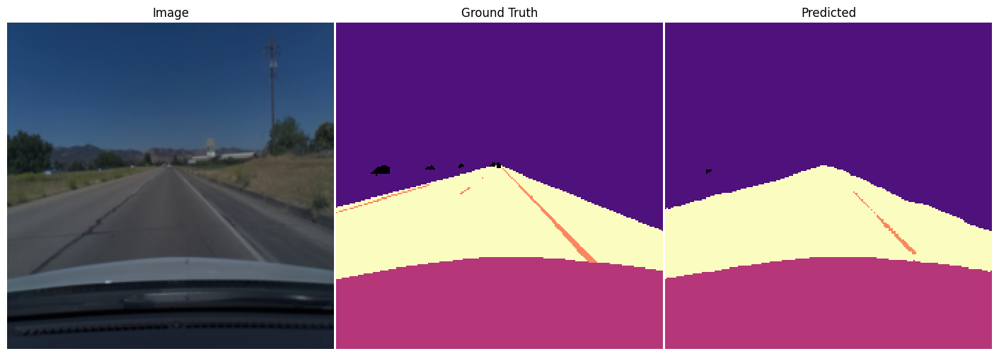

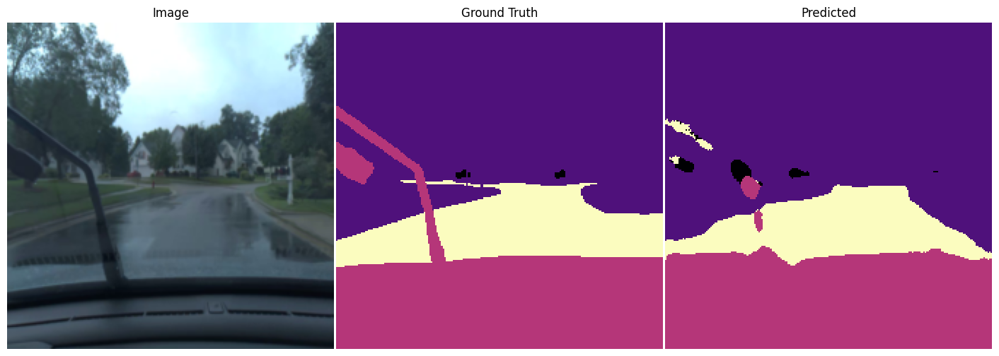

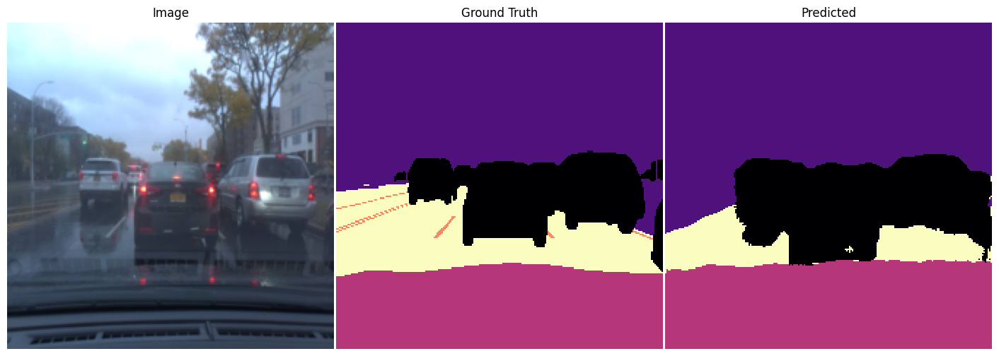

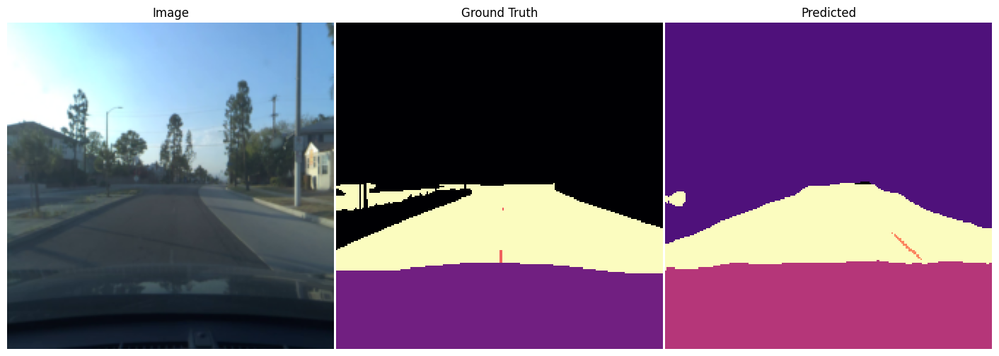

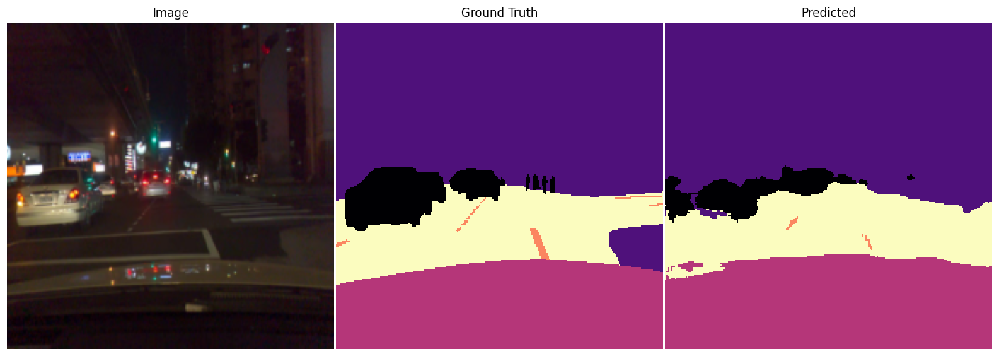

...

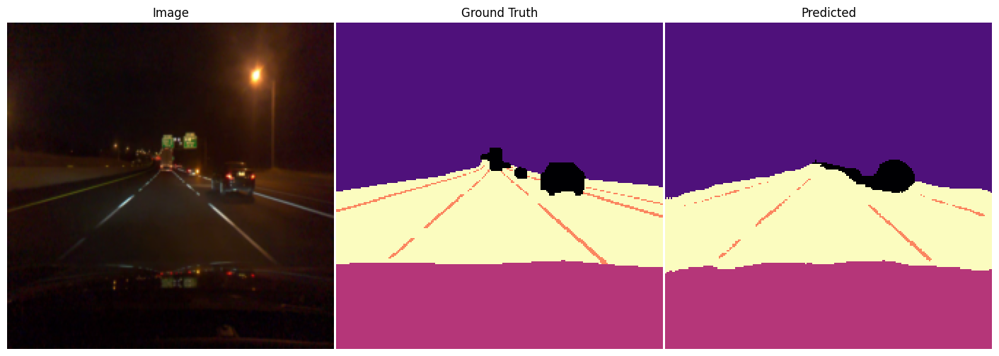

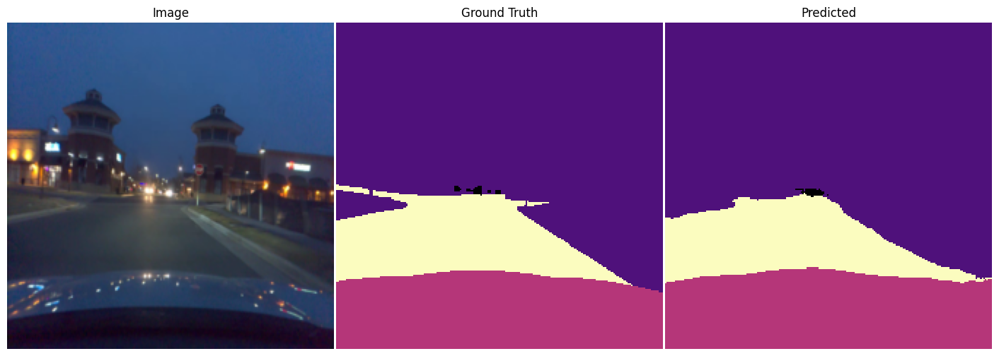

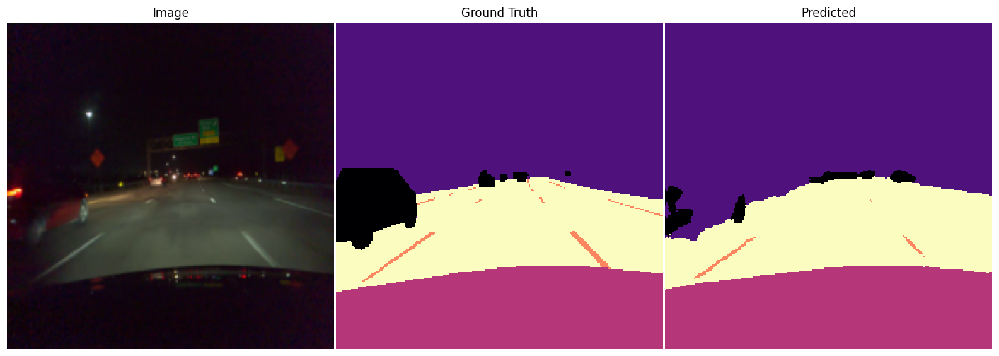

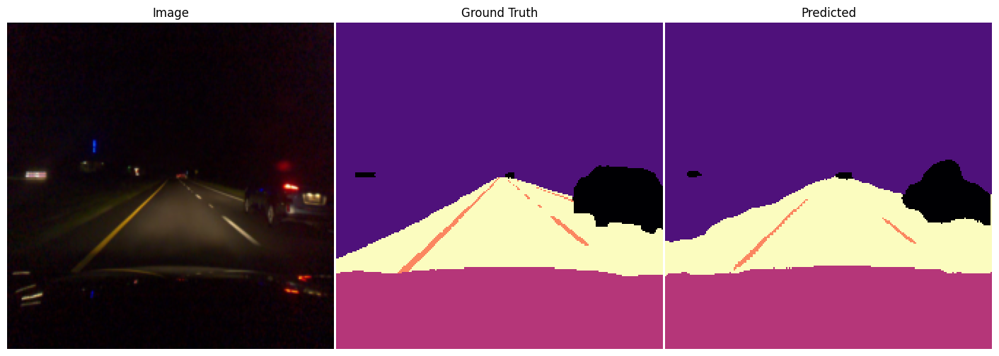

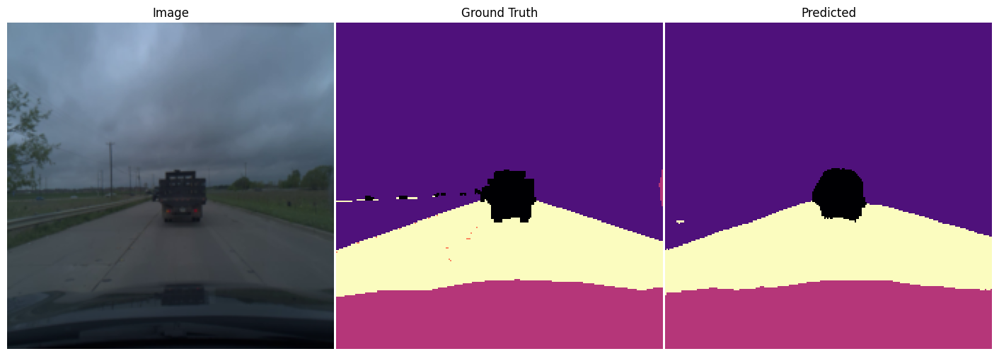

In [ ]:
model.eval()
with torch.no_grad():
    for i in range(20):
        image, mask = test_dataset[i]

        if image.ndim == 2:
            image = image.unsqueeze(0)

        input_tensor = image.unsqueeze(0).to(device)
        logits = model(input_tensor)
        if isinstance(logits, dict) and 'out' in logits:
            logits = logits['out']

        probs = F.softmax(logits, dim=1)
        preds = torch.argmax(probs, dim=1)

        show_images((image, mask.unsqueeze(0), preds.cpu()),
                    ('Image', 'Ground Truth', 'Predicted'))


In [ ]:
from sklearn.metrics import confusion_matrix, recall_score, accuracy_score
import numpy as np
import torch

# Collect all true and predicted labels
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, masks in test_loader:  # Use your validation loader
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)  # No ['out'] for UnetPlusPlus
        preds = torch.argmax(outputs, dim=1)

        all_preds.append(preds.cpu().numpy().reshape(-1))
        all_labels.append(masks.cpu().numpy().reshape(-1))

# Flatten all predictions and labels
all_preds_flat = np.concatenate(all_preds)
all_labels_flat = np.concatenate(all_labels)

# Compute metrics
acc = accuracy_score(all_labels_flat, all_preds_flat)
recall = recall_score(all_labels_flat, all_preds_flat, average=None, zero_division=0)
conf_matrix = confusion_matrix(all_labels_flat, all_preds_flat)

# Print results
print(f"Accuracy: {acc:.4f}")
for i, r in enumerate(recall):
    print(f"Recall for class {i}: {r:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)

Accuracy: 0.9598
Recall for class 0: 0.9274
Recall for class 1: 0.3536
Recall for class 2: 0.9890
Recall for class 3: 0.9771
Recall for class 4: 0.6639

Confusion Matrix:
[[ 888983    1007   21829   39221    7541]
 [  15701    9180     344     612     124]
 [  10411       3 1240717    2946     478]
 [  38995     272    4980 2597476   16762]
 [   9680       2    1985   28675   79676]]


In [ ]:
import cv2
import torch
import numpy as np
import torch.nn.functional as F
from torchvision import transforms

# Load your trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

# Basic transform: resize, tensor, normalize (optional)
transform = transforms.Compose([
    transforms.ToTensor(),  # Converts (H,W,C) to (C,H,W) and scales [0,255] to [0,1]
])

# Open input video
cap = cv2.VideoCapture("/content/road_video.mp4")
fps = cap.get(cv2.CAP_PROP_FPS)
w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
out = cv2.VideoWriter("output.mp4", cv2.VideoWriter_fourcc(*'mp4v'), fps, (w, h))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    img = cv2.resize(frame, (160, 160))  # Resize to model input size
    img = transform(img).unsqueeze(0).to(device)  # Shape: (1, 3, 150, 150)

    with torch.no_grad():
        output = model(img)  # Shape: (1, 5, 150, 150)
        output = F.interpolate(output, size=(h, w), mode="bilinear", align_corners=False)
        pred_mask = torch.argmax(output.squeeze(), dim=0).cpu().numpy()  # Shape: (H, W)

    # Convert mask to RGB colors (example: 5 classes)
    color_map = np.array([[0, 0, 0], [255, 0, 0], [0, 255, 0], [0, 0, 255], [255, 255, 0]])
    mask_rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for class_idx in range(5):
        mask_rgb[pred_mask == class_idx] = color_map[class_idx]

    # Overlay mask on original frame
    overlay = cv2.addWeighted(frame, 0.7, mask_rgb, 0.3, 0)

    # Write to output
    out.write(overlay)

cap.release()
out.release()
cv2.destroyAllWindows()
